In [1]:

# import some utilities
# definition of some plotting tools

%matplotlib inline
from bokeh.layouts import gridplot
from bokeh.layouts import layout
from bokeh.plotting import figure, output_notebook, show
from bokeh.models import ColumnDataSource
from bokeh.plotting import output_file
from bokeh.palettes import Category10
from bokeh.io import export_png
from bokeh.models import Legend
from bokeh.models import Range1d
from bokeh.models import ColorBar
from bokeh.models import LinearAxis
from bokeh.models import DatetimeTickFormatter

# select a palette
#from bokeh.palettes import Dark2_25 as palette
from bokeh.palettes import Spectral11, Category20b
from bokeh.palettes import Spectral6
from bokeh.plotting import output_file
from bokeh.transform import linear_cmap

import itertools  

import datetime

import itertools

import numpy
import os
import re
import sys
from netCDF4 import Dataset

import pandas
import logging
import math

def color_gen():
    yield from itertools.cycle(Category10[10])
color = color_gen()
from bokeh.resources import INLINE
output_notebook(INLINE)
export = False

Loading BokehJS ...

In [2]:
import logging
import sys
sys.path.append(os.path.join(os.environ["HOME"],"Projects","SeaFlect","python"))
from DataPoolAccessModule import AeolusDataClass
from DataPoolAccessModule import QualityControlClass
from SurfaceReflectanceModule import SurfaceReflectanceModelClass


def make_plot(title, hist, edges):
    p = figure(title=title, tools='', background_fill_color="#fafafa")
    p.quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:],
           fill_color="navy", line_color="white", alpha=0.5)
    p.y_range.start = 0
    #p.legend.location = "center_right"
    #p.legend.background_fill_color = "#fefefe"
    p.xaxis.axis_label = 'x'
    p.yaxis.axis_label = 'Pr(x)'
    p.grid.grid_line_color="white"
    return p

verbose_level = 'info'
logger=logging.getLogger()
logging.basicConfig(level=getattr(logging, verbose_level.upper()))
Cm = {}
Li =  {}
wind_speed = numpy.linspace(2, 24, 23)
theory=SurfaceReflectanceModelClass(logger=logger)
theory.Ro_fixed=0.08
Li["low"] = numpy.array([theory.surface_reflectance(model="li",u=key, theta=33) for key in wind_speed]).transpose()    
Cm["low"] = numpy.array([theory.surface_reflectance(model="concept",u=key, theta=33) for key in wind_speed]).transpose()
theory.Ro_fixed=0.016
Li["high"] = numpy.array([theory.surface_reflectance(model="li",u=key, theta=33) for key in wind_speed]).transpose()    
Cm["high"] = numpy.array([theory.surface_reflectance(model="concept",u=key, theta=33) for key in wind_speed]).transpose()
    
AeolusProductObject = AeolusDataClass(debug=False, \
                                          generate=False,
                                          logger=logger)
exp = "fixed_range"
#exp = "flexible_range"
data_file_name = "seaflect_data_vre_"+exp + ".pkl"
AeolusProductObject.pickle_data_file=os.path.join("SeaFlectProjectData","DataPool","seaflect_data_"+exp + ".pkl")
figure_path = os.path.join("project_figures", "notebook", exp)
if not os.path.exists(figure_path):
    os.makedirs(figure_path)
    
[data_pool, available_periods, available_regions] = AeolusProductObject.get_data()
    
    
AeolusProductObject.data_pool=data_pool
# now that we have a consistent dataset we can make an annual
AeolusProductObject._create_annual_(periods=available_periods)
# and globa
AeolusProductObject._create_global_(regions=available_regions)

#definitions of range bins accoring to c-convention

range_bin={"top":0, "atmosphere":3, "surface":4, "ocean":5, "background":6}



# Basic parameters

### Thickness 

The thickness of the range bins is important as it is used to estimate the atmospheric component in the surface range bin. There are two ways to estimate the thickness, namely from the altitude parameter of the interfaces between the range gates, and from the range parameter. The altitude parameter represents the height of the interfaces with respect to a reference geoid. the range parameter is a height of the range gate to the satellite. 

For instance the thickness of range bin 22 is calculated either through 

$$\Delta_\zeta^{22} = \zeta^{22} - \zeta^{23}$$

or through 

$$\Delta_\Gamma^{22} = \Gamma^{23} - \Gamma^{22}$$

Where it should be realised that the altitude $\zeta$ represents the bottom of the layer and is with respect to the normal to  the surface, while the range $\Gamma$ is along the line of sight. Thus there is a geometrical difference between the two parameters. 

Next figure shows the altitude as this is used in the analysis of the ACCD counts.

In [3]:
# the altitude of the interfaces
region="E"
graphic=[]
period="AnnualCycle"
dataset=AeolusProductObject.data_pool[period][region]
time = dataset["L1Bmie"]["date"]
p=figure(x_axis_type="datetime", plot_width=800, plot_height=150, \
         title="Height levels {} {}".format(period, region),\
         tools="box_zoom,pan,reset,save,wheel_zoom",toolbar_location="below")
#basic signal
p.circle(time, dataset["L1Bmie"]["alt"][:,range_bin["atmosphere"]], \
         color="red", legend_label="atmosphere")
p.circle(time, dataset["L1Bmie"]["alt"][:,range_bin["surface"]], \
         color="green", legend_label="surface")
p.circle(time, dataset["L1Bmie"]["alt"][:,range_bin["ocean"]],\
         color="blue", legend_label="ocean")
p.line(time, dataset["L1Bmie"]["altdem"][:], color="black", legend_label="dem")
p.yaxis.axis_label = 'Heigth [m]'
graphic.append(p)
plot = gridplot(graphic, ncols=1, width=800, height=300,toolbar_location="right")
show(plot)
if export:
    figure_name = os.path.join(figure_path,"alt_time_serie_{}.png".format(period))
    export_png(plot, filename=figure_name)   

In [4]:
region="E"
graphic=[]
period="AnnualCycle"
dataset=AeolusProductObject.data_pool[period][region]
time = dataset["L1Bmie"]["date"]
p=figure(x_axis_type="datetime", plot_width=800, plot_height=150, \
         title="Ocean levels {} {}".format(period, region),\
         tools="box_zoom,pan,reset,save,wheel_zoom")
#basic signal
p.circle(time, dataset["L1Bmie"]["alt"][:,range_bin["ocean"]],\
         color="blue", legend_label="ocean")
p.line(time, dataset["L1Bmie"]["altdem"][:], color="black", legend_label="dem")
p.yaxis.axis_label = 'Heigth [m]'
p.y_range = Range1d(-150,50)
graphic.append(p)
plot = gridplot(graphic, ncols=1, width=800, height=300,toolbar_location="right")
show(plot)
if export:
    figure_name = os.path.join(figure_path,"ocean_alt_time_serie_{}.png".format(period))
    export_png(plot, filename=figure_name)   

## Discussion of the altitude signal

It appears that the altitude parameter shows several isolated observations where the values of the altitude is well above any expected value. Outside of these isolated periods, the data contains the expected values, for the .

### Ocean altitude

Although a detailed view is possible using the zoom function at the upper right of the figure as separate figure is presented with only the bottom interface of the surface range bin and the height of the surface according to the DEM. 

This zoom of the ocean altitude indicates a saw-tooth behaviour of the bottom boundary of the surface return, which is a common feature resulting from a index problem during interpolation.It is not clear if indeed the altitude is calculated using an interpolation routine, but if it is, then there is a hint of an index issue. 

Second issue is the height of the ocean altitude with respect to the dem. Meaning during the beginning of the period of interest the bottom of the surface range bin appears to be very close to the surface as indicated by the DEM. 

The altitude is derived from the time difference between receiving and sending out the laser pulse. There is an uncertainty in the recording, which translates to an uncertainty of 100m in the altitude. This means that it is not clear that during the beginning of the period of interest the surface is located in the nominal bin (23) or in bin 24. 

### Location of surface

The location of the surface according to dem parameter is fluctuating by several meters. How this parameter is derived is unclear. This could be a reflection of the variation of the sea surface across region E.

It does not appear a critical parameters as the thickness of the atmospheric sub-layer in the surface range bin is of the order of 100 - 200 meters.  

## Range

The next figure shows the range variable for the three range bins considered here and this parameter shows a lot of variation over the time of interest. This appears normal as a satellite orbit is never fixed. What is remarkable is if a detailed of the range of a single overpass over the region of interest is analysed. 

Zoom is possible through the tools at the upper right of the figure. After zooming in it appears that the data is organised in the vertical, that is during a single overpass over the region of interest the range is changing by 6 km. And this patterns repeats itself the following day.

location of Region E is indicated in the plot below, which shows the longitude extend of 25 degrees and latitude of 10, the region covers approximately a 2500 x 1000 km$^2$ region. Over such a region expect a variation in the range.


Text(0.5, 1.0, 'Location  E')

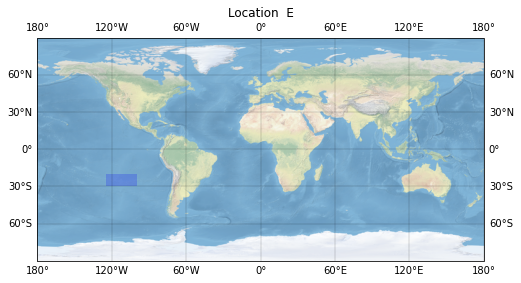

In [5]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import cartopy.crs as ccrs
import matplotlib.patches as mpatches
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
ax.stock_img()
gl = ax.gridlines(draw_labels=True, linewidth=0.3, color="black", alpha=0.5, linestyle="-")
lon=[-125, -100]
lat=[-30, -20]
ax.add_patch(mpatches.Rectangle(xy=[-125, -20], width=25, height=-10,
                                    facecolor='blue',
                                    alpha=0.2,
                                    transform=ccrs.PlateCarree())
                 )
ax.set_title("Location  {}".format("E"))

In [6]:
region="E"
graphic=[]
period="AnnualCycle"
dataset=AeolusProductObject.data_pool[period][region]
time = dataset["L1Bmie"]["date"]
p=figure(x_axis_type="datetime", plot_width=800, plot_height=150, \
         title="Range {} {}".format(period, region),\
         tools="box_zoom, pan,reset,save,wheel_zoom")
#basic signal
p.circle(time, dataset["L1Bmie"]["range"][:,range_bin["atmosphere"]], \
         color="red", legend_label="atmosphere")
p.yaxis.axis_label = 'Heigth [m]'
graphic.append(p)
p=figure(x_axis_type="datetime", plot_width=800, plot_height=150, \
         title="Range {} {}".format(period, region),\
         tools="box_zoom, pan,reset,save,wheel_zoom")
#basic signal
p.circle(time, dataset["L1Bmie"]["range"][:,range_bin["surface"]], \
         color="green", legend_label="surface")
p.yaxis.axis_label = 'Heigth [m]'
graphic.append(p)

p=figure(x_axis_type="datetime", plot_width=800, plot_height=150, \
         title="Range {} {}".format(period, region),\
         tools="box_zoom, pan,reset,save,wheel_zoom")
p.circle(time, dataset["L1Bmie"]["range"][:,range_bin["ocean"]],\
         color="blue", legend_label="ocean")
p.yaxis.axis_label = 'Heigth [m]'
graphic.append(p)

plot = gridplot(graphic, ncols=1, width=800, height=300, toolbar_location="right")
show(plot)
if export:
    figure_name = os.path.join(figure_path,"range_time_serie_{}.png".format(period))
    export_png(plot, filename=figure_name)   


### Thickness of range bin 21 (atmospheric range bin)

The introduction indicates that the thickness of a range bin can be calculated in two ways. What should not be overlooked is that the range parameter is along the line of sight while the alt parameter is a geometrical height above the surface (DEM). Thus there is a $\cos \theta$ with $\theta$ the zenith angle. From the platform this is 35$^o$ while at the surface this is 37.6 $^o$ due to the curvature of the earth. 

The next figure shows the value of $\Delta_\zeta^{22}$ and $\Delta_\Gamma^{22}$. After correcting for the satellite zenith angle, which appears to be 37.05. 

It would be good if there is a rangeDEM which indicates the surface along line of sight, such that the analysis can be done along the line of sight. Which is the measurement configuration. 

As this is not available we will use the alt parameter in our correction method.

In [7]:
import math
region="E"
graphic=[]
period="AnnualCycle"
dataset=AeolusProductObject.data_pool[period][region]
time = dataset["L1Bmie"]["date"]
p=figure(x_axis_type="datetime", plot_width=800, plot_height=150, \
         title="Thickness atmospheric range bin {} {}".format(period, region),\
         tools="box_zoom,pan,crosshair, reset,save,wheel_zoom")
#basic signal
d1 = dataset["L1Bmie"]["range"][:,range_bin["surface"]] - dataset["L1Bmie"]["range"][:,range_bin["atmosphere"]]
d1 *= numpy.cos(37.0/180.*math.pi)
d2 = dataset["L1Bmie"]["alt"][:,range_bin["atmosphere"]] - dataset["L1Bmie"]["alt"][:,range_bin["surface"]]
p.circle(time, d1, color="red", legend_label="range thickness")
p.circle(time, d2, color="green", legend_label="alt thickness")
p.yaxis.axis_label = 'Heigth [m]'
graphic.append(p)
plot = gridplot(graphic, ncols=1, width=800, height=300, toolbar_location="right")
show(plot)
if export:
    figure_name = os.path.join(figure_path,"thickness_time_serie_{}.png".format(period))
    export_png(plot, filename=figure_name)   

## Basic Signal

The return signal in four range bins are presented in the next figures. In particular the first atmospheric range bin, the lowest atmospheric range bin, the surface range bin and the ocean range bin.


### Return signal from upper most atmospheric range bin

The return signal from the upper most range bin (in black) appears to have a dynamical range between 1000 and 3000 units. There are a few large excursions. There seems to be a trend to smaller return signals at the end of the time scale considered here. Although there is a link between the magnitude of the return signal and the thickness of the range bin, this thickness is relatively stable in time as we can see from previous plots, while there appears a linear trend. This is most likely linked to cross talk. As there is little mie return signal from the highest atmospheric layers, the return signal might be dominated by the rayleigh detector. It is known that  the sensitivity is decreasing over time which could explain the trend. 

### Return signal from atmospheric and surface range bins

There are several interesting features before april 2020, but after this date, the return signals are relatively stable. No obvious trend is observed in either of the return signals. There is an indication that atmospheric signal is more varying towards end of the time domain, the ocean signal the opposite is observed. 

It should be noted that there is not linear relation between the range thickness and the return signal. Although this is used to correct the atmospheric contribution in the surface range bin. In the first two month of the period considered here the geometrical thickness of the atmospheric range bin was only half of the value in the last part of the period, namely 250 m versus 500 m. However the return signal for the atmospheric range bin does not double going from the first two months, to the last two months. This is because the return signal is generated by scattering off atmospheric molucules and the concentration of atmospheric molecules does not decrease linear with height. 

#### Note 

The reason the data is not normalised by thickness is that the surface range bin is a composite layer and hence such a normalisation does not automatically facilitate an easier comparison to other normalised return signals. 



In [8]:
region="E"
graphic=[]
period="AnnualCycle"
dataset=data_pool[period][region]
time = dataset["L1Bmie"]["date"]    
t=figure(x_axis_type="datetime", width=800, height=150, \
         tools="box_zoom,pan,crosshair, reset,save,wheel_zoom",\
           title="ACCD {} {}".format(period, region))
t.circle(time, dataset["L1Bmie"]["sgnl"][:,range_bin["top"]], \
         color="black", legend_label="top")
t.yaxis.axis_label = 'ACCD counts [-]'
t.legend.location = "top_left"
graphic.append(t)


s=figure(x_axis_type="datetime", width=800, height=150, \
         tools="box_zoom,pan,crosshair, reset,save,wheel_zoom",\
         title="ACCD {} {}".format(period, region))
s.circle(time, dataset["L1Bmie"]["sgnl"][:,range_bin["atmosphere"]], \
         color="red", legend_label="atmosphere")
s.yaxis.axis_label = 'ACCD counts [-]'
s.legend.location = "top_left"
graphic.append(s)

p22=figure(x_axis_type="datetime", width=800, height=150, \
           tools="box_zoom,pan,crosshair, reset,save,wheel_zoom",\
           title="ACCD {} {}".format(period, region))
p22.circle(time, dataset["L1Bmie"]["sgnl"][:,range_bin["surface"]], \
           color="green", legend_label="surface")
p22.yaxis.axis_label = 'ACCD counts [-]'
p22.legend.location = "top_left"
graphic.append(p22)


p23=figure(x_axis_type="datetime", width=800, height=150, \
           tools="box_zoom,pan,crosshair, reset,save,wheel_zoom",\
           title="ACCD {} {}".format(period, region))
p23.circle(time, dataset["L1Bmie"]["sgnl"][:,range_bin["ocean"]], \
           color="blue", legend_label="ocean")
p23.yaxis.axis_label = 'ACCD counts [-]'
p23.legend.location = "top_left"
graphic.append(p23)

plot = gridplot(graphic, ncols=1, width=800, height=300,\
                toolbar_location="right")
show(plot)
if export:
    figure_name = os.path.join(figure_path,"basic_accd_signal_{}_{}.png".format(period, region))
    export_png(plot, filename=figure_name)   

# Background signal

The background signal shown below is the *measured* reflected solar irradiance. It is measured at a specific part of the detector array called the imaging zone. The solar backscattered signal is a function of the solar cycle, and hence it has an annual cyclus. It should be noted that the integration time of the backscatter (3750 $\mu$ s) is larger than the integration time of the lidar return signal (2.1 or 16.8 $\mu$s), hence the dynamical range is much larger than the return signals.

The backscatter has two curves, for the ascending and descending orbit.

The figure below the background signal shows the solar altitude as function of time. The solar altitude is calculated using a python routine based on the pvlib library. This library provides the azimuth and zenith angle, for a given location and time and height above the surface. For the calculations we assume the sea surface. 

The solar altitude is calcated as 90 - zenith.

The azimuth angle is not presented as this provides no additional information.

If the solar altitude is smaller than a specific value, the sun is below the horizon and hence the amount of backscatter should be very small. As a threshold value of -7 or even a threshold of -16 can be used as the latter is defined as the astronomical twilight threshold. 

During the periods April - September the sun is below the horizon, and the backscatter is relatively small. 

What is remarkable from this figure is the sudden jump in solar altitude in spring and autumn. It is not clear if this is a bug in the diagnostic program (as the Aeolus time variable needs to be converted to a date-time string for the pvlib routine) or if the time variable itself has an jump. 


In [9]:
region="E"
graphic=[]
period="AnnualCycle"
dataset=data_pool[period][region]
time = dataset["L1Bmie"]["date"]

#===========================================================
b=figure(x_axis_type="datetime", width=800, height=150, \
           title="Background {} {}".format(period, region),\
         tools="box_zoom,pan,crosshair, reset,save,wheel_zoom")
b.circle(time, dataset["L1Bmie"]["sgnl"][:,range_bin["background"]], \
         color="brown", legend_label="background")
b.yaxis.axis_label = 'ACCD counts [-]'
b.legend.location = "top_left"
graphic.append(b)

s=figure(x_axis_type="datetime", plot_width=800, plot_height=150, \
           title="Solar Altitude {} {}".format(period, region),\
         tools="box_zoom,pan,crosshair, reset,save,wheel_zoom")

s.y_range = Range1d(start=-50, end=50) 
s.extra_y_ranges = {"sunazi": Range1d(start=180, end=360) }

# s.circle(time, dataset["L1Bmie"]["sunazi"][:], color="green",\
#        y_range_name="sunazi")

s.circle(time, dataset["L1Bmie"]["sunalt"][:], color="blue")

x=[time[0], time[-1]]
y=[AeolusProductObject.sunalt_threshold, AeolusProductObject.sunalt_threshold]
s.line(x, y, color="black", line_width=6, \
       legend_label="Threshold")

y=[AeolusProductObject.astronomical_threshold, AeolusProductObject.astronomical_threshold]
s.line(x, y, color="purple", line_width=6, \
       legend_label="Astonomical Threshold")

#s.yaxis.axis_label = 'Altitude [Degree]'
## Adding the second axis to the plot. order is everything  
#s.add_layout(LinearAxis(y_range_name="sunazi", axis_label='Azimuth [Degree]'), 'right')

s.legend.location = "top_left"
graphic.append(s)

plot = gridplot(graphic, ncols=1, width=800, height=300, toolbar_location="right")
show(plot)
if export:
    figure_name = os.path.join(figure_path,"background_solar_angles_{}_{}.png".format(period, region))
    export_png(plot, filename=figure_name)   